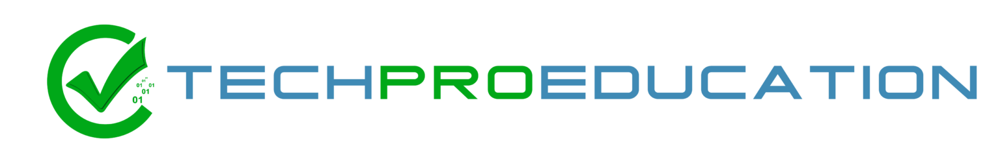

# Hand Written Digits Project EDA - LR

Data reference link : https://archive.ics.uci.edu/dataset/81/pen+based+recognition+of+handwritten+digits

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

plt.rcParams["figure.figsize"] = (9,5)

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier

from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split, cross_validate, cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score, cross_validate

from sklearn.pipeline import Pipeline

from sklearn.tree import plot_tree

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_auc_score, auc, roc_curve, average_precision_score, precision_recall_curve
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score
from sklearn.metrics import make_scorer

from statsmodels.stats.outliers_influence import variance_inflation_factor

from yellowbrick.classifier import ClassPredictionError
from yellowbrick.classifier import ROCAUC

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")


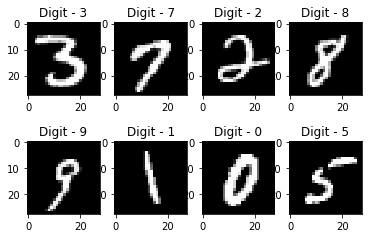

# Understanding the Data

## <span style="color:purple">Digit Database Collection and Structure</span>

In the process of **creating a digit database**, a total of **250 samples** were collected from **44 distinct writers**. Among these writers, **30** were selected for various stages of **training, cross-validation, and writer-dependent testing**. The remaining **14 writers** were designated for **writer-independent testing**. The database is also available in the **UNIPEN format**.

### <span style="color:purple">Data Collection Process</span>

During the data collection phase, each writer was instructed to generate **250 handwritten digits**. These digits were to be written in a **random order**, confined within designated boxes on a tablet screen with a resolution of **500 by 500 pixels**. Notably, the subjects were monitored solely during the initial entry screens of the process.

Each screen presented **five boxes**, and the corresponding digits to be written were displayed above these boxes. The participants were explicitly directed to inscribe their handwriting only within these specified boxes. In the event of errors or dissatisfaction with their writing, participants were guided to rectify the content of a box using an **on-screen button**.

An intriguing aspect of the data collection procedure is that the **first ten digits** written by each participant were disregarded. This decision was made due to the unfamiliarity of most writers with this particular type of input device. However, it's worth noting that the subjects themselves were unaware of this omission.

The comprehensive digit database and its associated details provide a valuable resource for various research and analysis purposes.

# 2. Data

In [2]:
data = pd.read_csv("pendigits_txt.csv")
data.head()

,input1,input2,input3,input4,input5,input6,input7,input8,input9,input10,input11,input12,input13,input14,input15,input16,class
0,47,100,27,81,57,37,26,0,0,23,56,53,100,90,40,98,8
1,0,89,27,100,42,75,29,45,15,15,37,0,69,2,100,6,2
2,0,57,31,68,72,90,100,100,76,75,50,51,28,25,16,0,1
3,0,100,7,92,5,68,19,45,86,34,100,45,74,23,67,0,4
4,0,67,49,83,100,100,81,80,60,60,40,40,33,20,47,0,1


In [3]:
data.sample(10)

,input1,input2,input3,input4,input5,input6,input7,input8,input9,input10,input11,input12,input13,input14,input15,input16,class
1444,31,85,51,100,78,80,64,63,100,41,84,11,41,0,0,10,3
4519,0,76,28,100,48,75,34,43,11,13,16,0,57,3,100,3,2
3691,0,87,39,100,61,70,47,27,36,0,11,33,55,35,100,39,7
8967,6,100,60,98,62,56,35,15,45,0,100,26,69,40,0,38,7
245,65,96,81,66,100,100,40,92,71,64,93,45,65,5,0,0,9
10896,0,73,25,100,69,95,55,58,100,56,90,21,47,0,2,8,3
10759,2,85,43,100,66,79,54,52,100,39,97,13,51,2,0,0,3
4606,49,100,17,71,0,39,11,7,66,0,100,24,48,33,21,8,6
4144,95,100,50,82,19,58,0,31,18,6,73,0,100,14,44,12,6
1041,7,91,57,100,8,96,0,54,57,50,100,21,46,0,1,14,5


# 3. Exploratory Data Analysis and Visualization

In [4]:
def SuperInfo(df, dropna=False):
    """
    Returns a dataframe consisting of datatypes, nuniques, #s of nulls head(1), most frequent item and its frequncy,
    where the column names are indices.
    """
    dt=pd.DataFrame(df.dtypes, columns=["Type"])
    dn=pd.DataFrame(df.nunique(), columns=["Nunique"])
    nonnull=pd.DataFrame(df.isnull().sum(), columns=["#of Missing"])
    firstT=df.head(1).T.rename(columns={0:"First"})
    MostFreqI=pd.DataFrame([df[x].value_counts().head(1).index[0] for x in df.columns], columns=["MostFreqItem"],index=df.columns)
    MostFreqC=pd.DataFrame([df[x].value_counts().head(1).values[0] for x in df.columns], columns=["MostFreqCount"],index=df.columns)
    return pd.concat([dt,dn,nonnull,MostFreqI,MostFreqC,firstT],axis=1)

In [5]:
SuperInfo(data, dropna=False)

,Type,Nunique,#of Missing,MostFreqItem,MostFreqCount,First
input1,int64,101,0,0,2364,47
input2,int64,96,0,100,3115,100
input3,int64,101,0,0,953,27
input4,int64,98,0,100,4387,81
input5,int64,101,0,0,1568,57
input6,int64,101,0,100,1115,37
input7,int64,101,0,0,988,26
input8,int64,101,0,0,1556,0
input9,int64,101,0,100,1764,0
input10,int64,101,0,0,2239,23


In [6]:
data.shape

(10992, 17)

In [7]:
raisin_duplicated = data[data.duplicated() == True]
len(raisin_duplicated)

0

In [8]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
input1,10992.0,38.814320,34.257783,0.0,6.0,32.0,65.0,100.0
input2,10992.0,85.120269,16.218571,0.0,76.0,89.0,100.0,100.0
input3,10992.0,40.605622,26.342984,0.0,20.0,40.0,58.0,100.0
input4,10992.0,83.774199,19.163646,0.0,72.0,91.0,100.0,100.0
input5,10992.0,49.770378,34.100515,0.0,18.0,53.0,78.0,100.0
input6,10992.0,65.573144,26.996688,0.0,49.0,71.0,86.0,100.0
input7,10992.0,51.220251,30.576881,0.0,28.0,53.5,74.0,100.0
input8,10992.0,44.498999,29.906104,0.0,23.0,43.0,64.0,100.0
input9,10992.0,56.868541,34.135530,0.0,29.0,60.0,89.0,100.0
input10,10992.0,33.695961,27.251548,0.0,7.0,33.0,54.0,100.0


In [9]:
data.columns

Index(['input1', 'input2', 'input3', 'input4', 'input5', 'input6', 'input7',
       'input8', 'input9', 'input10', 'input11', 'input12', 'input13',
       'input14', 'input15', 'input16', 'class'],
      dtype='object')

# 4. Feature Observation

### Feature

In [10]:
for i in data.columns:
    fig = px.box(data, x=i)
    fig.show()

### Target

In [11]:
data["class"].value_counts()

2    1144
4    1144
1    1143
0    1143
7    1142
6    1056
8    1055
5    1055
9    1055
3    1055
Name: class, dtype: int64

### Feature and Target

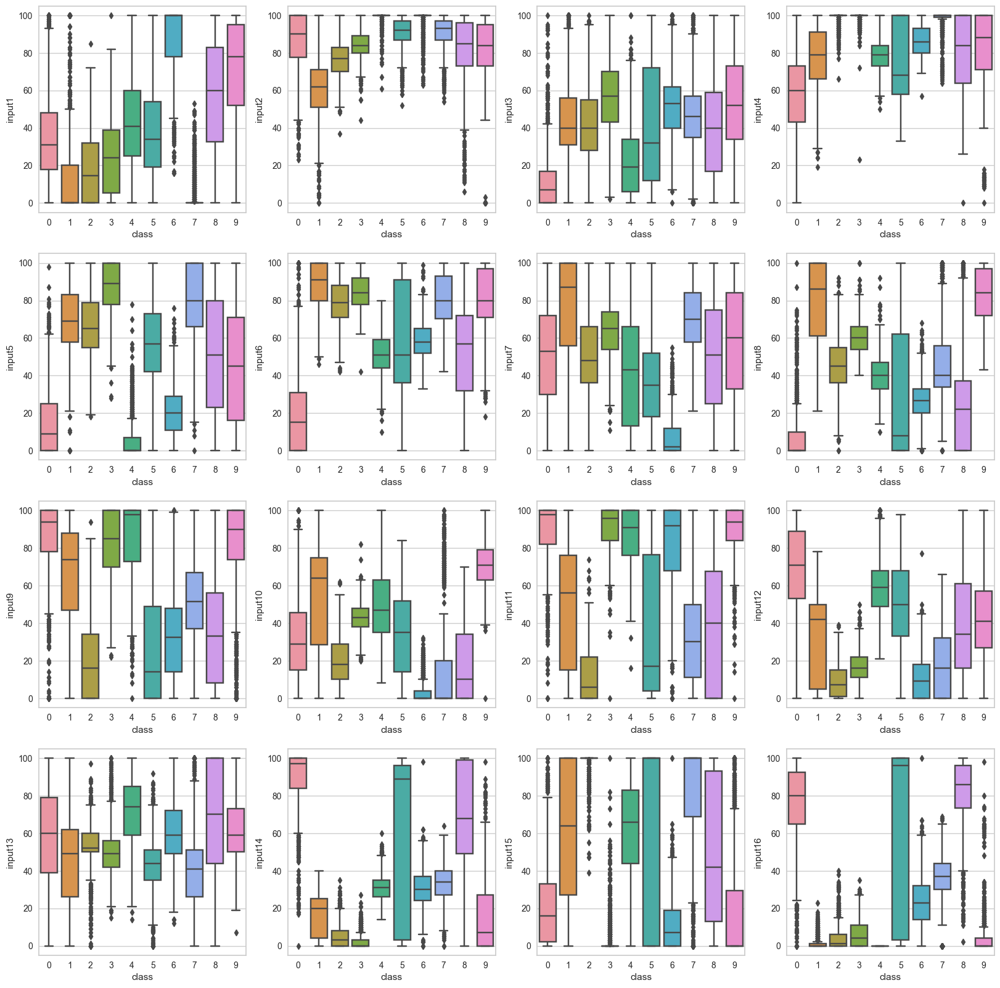

In [12]:
index = 0
plt.figure(figsize=(20,20))
for feature in data.columns:
    if feature != "class":
        index += 1
        plt.subplot(4,4,index)
        sns.boxplot(x='class',y=feature,data=data)
plt.show()

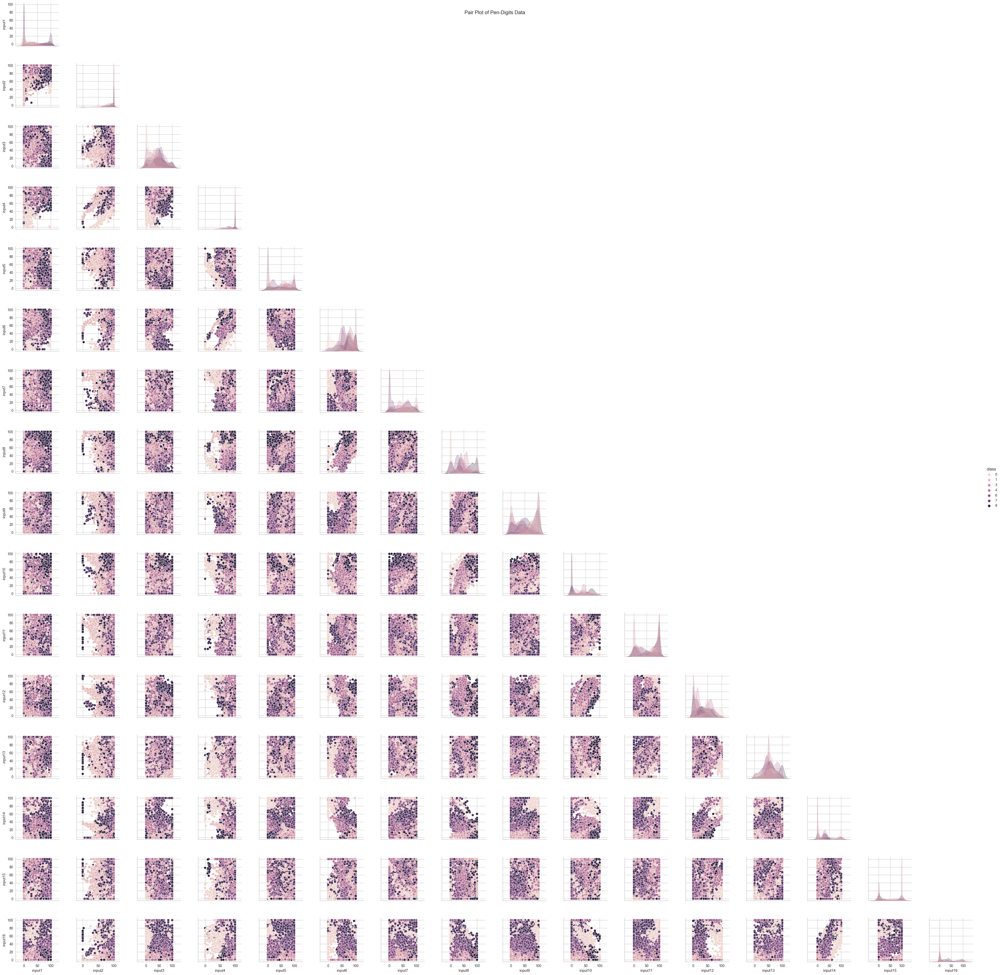

In [79]:
g = sns.pairplot(data=data, diag_kind="kde", hue="class")

# Set plot title and axis labels
plt.suptitle("Pair Plot of Pen-Digits Data")
plt.xlabel("Variable")
plt.ylabel("Variable")

# Remove upper diagonal subplots
for i, j in zip(*plt.np.triu_indices_from(g.axes, 1)):
    g.axes[i, j].remove()

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Display the plot
plt.show()

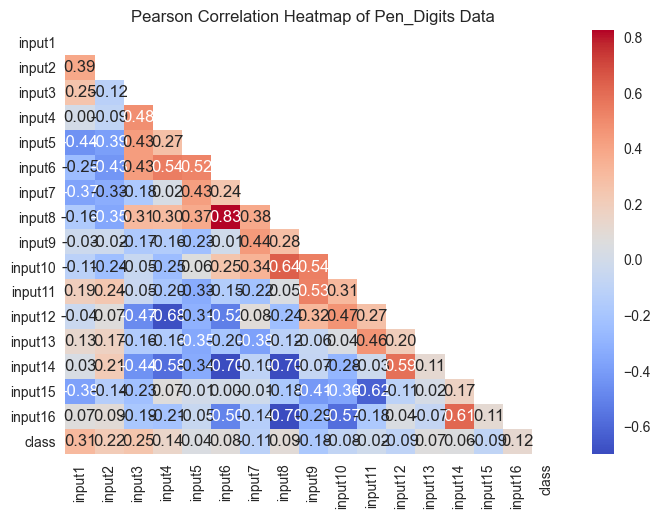

In [80]:
# Create a correlation heatmap
corr_matrix = data.corr(method = "spearman")
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Change colors for upper and lower triangles
sns.heatmap(corr_matrix, mask=mask, cmap="coolwarm", annot=True, fmt=".2f")

# Set plot title
plt.title("Pearson Correlation Heatmap of Pen_Digits Data")

# Display the plot
plt.show()

### Final Check

# 5. Use Transformation If Neccessary

# 6. Machine Learning Process¶

### Splitting the dataset into X (independent variables) and y (dependent variable)¶

In [15]:
X = data.drop(["class"], axis=1)
y = data["class"]

### Train | Test Split and Scaling

* Data 1000'e kadar (row 1000'e kadarsa) %70 Train, %30 Test (Train için En düşük bu olmalı.).

* Data 1000 - 100.000 ler arasında ise %90-80 Train %10-20 Test.

* Data 100.000 - 1.000.000 lar arasında ise %95 Train %5 Test.

* Data milyonlar üzerinde ise %99 Train, %1 Test olarak bölünse iyi olur.

In [16]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=False)

In [17]:
y_train.value_counts()

0    809
1    803
2    798
4    798
7    794
8    743
9    739
5    738
6    736
3    736
Name: class, dtype: int64

In [18]:
y_test.value_counts()

7    348
2    346
4    346
1    340
0    334
6    320
3    319
5    317
9    316
8    312
Name: class, dtype: int64

### Scaling the Data

In [19]:
scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Logistic Regression

### Lojistic Regression Model Assumptions and Application¶

Here are the Logistic Regression's assumptions.

* No excessive (outlier) or effective value.
* There should be no multicollinearity problem among independent variables.
* Sample size large enough to use model.
* There should be relationship between the dependent variable and the independent variable(at least interval scale).

### Training the Model

In [20]:
log_model = LogisticRegression()
log_model.fit(X_train_scaled, y_train)
y_pred=log_model.predict(X_test_scaled)
y_pred_proba = log_model.predict_proba(X_test_scaled)
test_data = pd.concat([X_test, y_test], axis=1)
test_data["pred"] = y_pred
test_data["pred_proba"] = y_pred_proba[:,1]
test_data.sample(10)

,input1,input2,input3,input4,input5,input6,input7,input8,input9,input10,input11,input12,input13,input14,input15,input16,class,pred,pred_proba
8997,18,100,80,95,90,61,52,26,26,0,100,16,79,32,0,36,7,6,2.383852e-07
7892,63,100,33,90,5,56,10,18,61,0,100,22,46,36,0,16,6,6,3.948184e-07
8382,24,100,24,99,0,64,38,41,99,39,100,78,89,39,85,0,4,4,5.686021e-05
7794,29,94,91,100,60,92,34,70,72,65,100,31,60,0,0,13,5,5,2.908953e-04
9990,22,92,17,53,63,30,27,0,0,17,14,64,46,98,100,100,5,5,1.556977e-11
8554,36,81,42,100,100,97,71,70,84,55,94,26,60,0,0,5,3,3,1.742166e-04
8633,56,93,0,95,60,65,100,29,49,0,9,28,39,66,37,100,8,8,2.693364e-12
7936,37,55,41,86,100,100,97,71,83,53,96,23,49,0,0,9,3,3,3.352878e-02
10143,6,91,23,60,73,41,41,0,8,29,0,81,38,96,100,100,5,5,1.939891e-11
9117,80,100,37,76,10,50,0,22,39,0,100,13,68,37,2,46,6,6,1.136360e-11


### Evaluating the Model

In [21]:
def eval_metric(model, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))
    print()
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
eval_metric(log_model, X_train_scaled, y_train, X_test_scaled, y_test)

Train_Set
[[770   4   0   0   3   1   2   0  26   3]
 [  0 749  11   7   2  21   3   4   0   6]
 [  0   9 789   0   0   0   0   0   0   0]
 [  0   2   1 725   1   2   0   3   0   2]
 [  0   2   0   0 790   1   0   2   0   3]
 [  1   8   0   3   0 682   0   1  16  27]
 [  0   0   0   0   1   1 731   0   3   0]
 [  0   4   2   1   0   5   0 776   2   4]
 [ 16   5   1   0   0  20   0   3 697   1]
 [  1   5   0   5   2  14   0   0   0 712]]
              precision    recall  f1-score   support

           0       0.98      0.95      0.96       809
           1       0.95      0.93      0.94       803
           2       0.98      0.99      0.99       798
           3       0.98      0.99      0.98       736
           4       0.99      0.99      0.99       798
           5       0.91      0.92      0.92       738
           6       0.99      0.99      0.99       736
           7       0.98      0.98      0.98       794
           8       0.94      0.94      0.94       743
           9      

In [22]:
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i)
                          for i in range(len(X.columns))]
 
print(vif_data)

    feature        VIF
0    input1   6.541409
1    input2  47.533869
2    input3  11.844790
3    input4  95.382821
4    input5  17.557596
5    input6  81.101924
6    input7  20.026546
7    input8  46.730447
8    input9  22.621024
9   input10  25.171921
10  input11  27.475217
11  input12  29.373539
12  input13  17.223829
13  input14  38.499420
14  input15   7.727484
15  input16  14.142242


* We see VIF score shows that we have a multicolinearity issues except for input1 and input 15.

### Cross Validate

In [23]:
model = LogisticRegression()

scores = cross_validate(model, X_train_scaled, y_train, scoring = ['accuracy', 'precision_weighted','recall_weighted',
                                                                   'f1_weighted'], cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_accuracy              0.960877
test_precision_weighted    0.961366
test_recall_weighted       0.960877
test_f1_weighted           0.960848
dtype: float64

### GridSearchCV

In [24]:
log_model = LogisticRegression(max_iter=100000, random_state=1)
penalty = ["l2"]
C = np.logspace(-1, 5, 20)

param_grid = {"penalty" : penalty,
             "C" : C}

grid_model = GridSearchCV(log_model, param_grid = param_grid, scoring="accuracy")
grid_model.fit(X_train_scaled, y_train)

GridSearchCV(estimator=LogisticRegression(max_iter=100000, random_state=1),
             param_grid={'C': array([1.00000000e-01, 2.06913808e-01, 4.28133240e-01, 8.85866790e-01,
       1.83298071e+00, 3.79269019e+00, 7.84759970e+00, 1.62377674e+01,
       3.35981829e+01, 6.95192796e+01, 1.43844989e+02, 2.97635144e+02,
       6.15848211e+02, 1.27427499e+03, 2.63665090e+03, 5.45559478e+03,
       1.12883789e+04, 2.33572147e+04, 4.83293024e+04, 1.00000000e+05]),
                         'penalty': ['l2']},
             scoring='accuracy')

In [25]:
grid_model.best_params_

{'C': 16.23776739188721, 'penalty': 'l2'}

In [26]:
eval_metric(grid_model, X_train_scaled, y_train, X_test_scaled, y_test)  

Train_Set
[[774   3   0   0   2   2   1   0  25   2]
 [  0 772   7   7   1   6   2   2   0   6]
 [  0   9 788   0   0   1   0   0   0   0]
 [  0   2   2 726   0   2   0   1   1   2]
 [  0   3   0   0 792   0   0   1   0   2]
 [  4   6   0   5   0 685   0   1  15  22]
 [  0   0   0   0   1   1 732   0   2   0]
 [  0   3   2   1   0   3   0 779   2   4]
 [ 17   1   0   0   0  21   0   3 700   1]
 [  1   3   0   5   2  12   0   0   0 716]]
              precision    recall  f1-score   support

           0       0.97      0.96      0.96       809
           1       0.96      0.96      0.96       803
           2       0.99      0.99      0.99       798
           3       0.98      0.99      0.98       736
           4       0.99      0.99      0.99       798
           5       0.93      0.93      0.93       738
           6       1.00      0.99      1.00       736
           7       0.99      0.98      0.99       794
           8       0.94      0.94      0.94       743
           9      

## ROC (Receiver Operating Curve) and AUC (Area Under Curve)

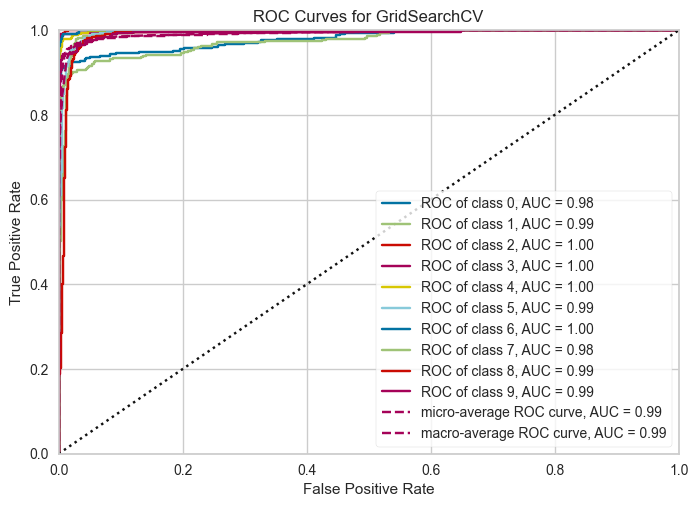

In [27]:
model = grid_model
visualizer = ROCAUC(model)

visualizer.fit(X_train_scaled, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test_scaled, y_test)        # Evaluate the model on the test data
visualizer.show();

# KNN

### KNN Assumptions and Application¶

### Training the Model

In [28]:
knn_model = KNeighborsClassifier()
knn_model.fit(X_train_scaled,y_train)
y_pred = knn_model.predict(X_test_scaled)
y_pred_proba = knn_model.predict_proba(X_test_scaled)
my_dict = {"Actual": y_test, "Pred":y_pred, "Proba_1":y_pred_proba[:,1], "Proba_0":y_pred_proba[:,0]}
pd.DataFrame.from_dict(my_dict).sample(10)

,Actual,Pred,Proba_1,Proba_0
9520,2,2,0.0,0.0
10137,7,7,0.0,0.0
8606,0,0,0.0,1.0
8656,3,3,0.0,0.0
8913,3,3,0.0,0.0
8142,3,3,0.0,0.0
10495,0,0,0.0,1.0
10690,2,2,0.0,0.0
9670,5,3,0.0,0.0
8641,2,2,0.0,0.0


## Model Performance on Classification Tasks

In [29]:
eval_metric(knn_model,X_train_scaled, y_train, X_test_scaled, y_test)

Train_Set
[[803   0   0   0   3   0   1   0   0   2]
 [  0 797   5   1   0   0   0   0   0   0]
 [  0   3 794   0   0   0   0   1   0   0]
 [  0   0   2 731   1   0   0   1   0   1]
 [  0   0   0   0 797   0   0   0   0   1]
 [  0   0   0   1   0 736   0   0   1   0]
 [  0   0   1   0   0   1 734   0   0   0]
 [  0   0   0   1   0   0   0 793   0   0]
 [  1   1   0   0   0   0   0   0 741   0]
 [  0   0   0   0   0   0   0   1   0 738]]
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       809
           1       1.00      0.99      0.99       803
           2       0.99      0.99      0.99       798
           3       1.00      0.99      0.99       736
           4       1.00      1.00      1.00       798
           5       1.00      1.00      1.00       738
           6       1.00      1.00      1.00       736
           7       1.00      1.00      1.00       794
           8       1.00      1.00      1.00       743
           9      

## Elbow Method for Choosing Reasonable K Values

In [30]:
test_error_rates = []
train_error_rates = []

for k in range(1,30):
    knn_model = KNeighborsClassifier(n_neighbors=k)
    knn_model.fit(X_train_scaled,y_train) 
   
    y_pred_test = knn_model.predict(X_test_scaled)
    y_pred_train = knn_model.predict(X_train_scaled)
    
    test_error = 1 - accuracy_score(y_test,y_pred_test)
    test_error_rates.append(test_error)
    
    train_error = 1 - accuracy_score(y_train,y_pred_train)
    train_error_rates.append(train_error)

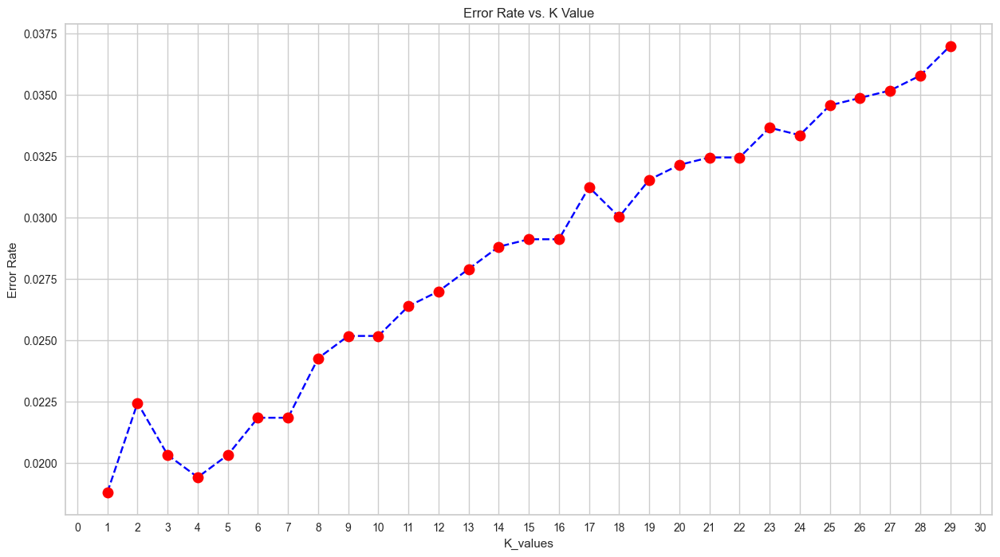

In [31]:
plt.figure(figsize=(15,8))
plt.plot(range(1,30), test_error_rates, color='blue', linestyle='--', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K_values')
plt.ylabel('Error Rate')

plt.xticks(range(0, 31, 1));

## Scores by Various K Values

In [32]:
knn = KNeighborsClassifier(n_neighbors=4)

knn.fit(X_train_scaled,y_train)
print('WITH K=5\n')
eval_metric(knn, X_train_scaled, y_train, X_test_scaled, y_test)

WITH K=5

Train_Set
[[806   0   0   0   2   0   1   0   0   0]
 [  0 802   1   0   0   0   0   0   0   0]
 [  0   3 795   0   0   0   0   0   0   0]
 [  0   0   2 731   1   0   0   1   0   1]
 [  0   0   0   0 797   0   0   0   0   1]
 [  0   0   0   1   0 736   0   0   1   0]
 [  0   0   0   0   0   1 735   0   0   0]
 [  0   0   0   1   0   0   0 793   0   0]
 [  1   1   0   0   1   1   0   0 739   0]
 [  0   0   0   0   0   0   0   0   0 739]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       809
           1       1.00      1.00      1.00       803
           2       1.00      1.00      1.00       798
           3       1.00      0.99      1.00       736
           4       1.00      1.00      1.00       798
           5       1.00      1.00      1.00       738
           6       1.00      1.00      1.00       736
           7       1.00      1.00      1.00       794
           8       1.00      0.99      1.00       743
        

## Cross Validate

In [33]:
model = KNeighborsClassifier(n_neighbors=4)

scores = cross_validate(model, X_train_scaled, y_train, scoring = ['accuracy', 'precision_weighted','recall_weighted',
                                                                   'f1_weighted'], cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_accuracy              0.994541
test_precision_weighted    0.994621
test_recall_weighted       0.994541
test_f1_weighted           0.994544
dtype: float64

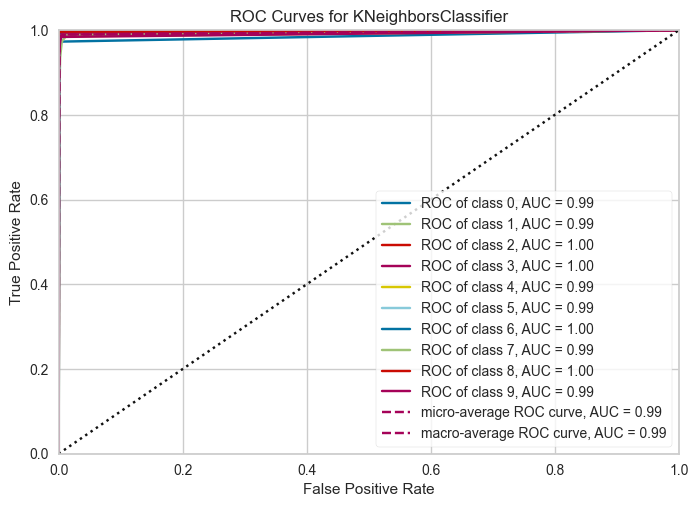

In [34]:
knn_model = model.fit(X_train_scaled, y_train) #Elbow gives me power to use 4.
visualizer = ROCAUC(knn_model)

visualizer.fit(X_train_scaled, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test_scaled, y_test)        # Evaluate the model on the test data
visualizer.show();

# Decision Tree

In [35]:
DT_model = DecisionTreeClassifier(random_state=1)
DT_model.fit(X_train, y_train)
y_pred = DT_model.predict(X_test)
eval_metric(DT_model, X_train, y_train, X_test, y_test)

Train_Set
[[809   0   0   0   0   0   0   0   0   0]
 [  0 803   0   0   0   0   0   0   0   0]
 [  0   0 798   0   0   0   0   0   0   0]
 [  0   0   0 736   0   0   0   0   0   0]
 [  0   0   0   0 798   0   0   0   0   0]
 [  0   0   0   0   0 738   0   0   0   0]
 [  0   0   0   0   0   0 736   0   0   0]
 [  0   0   0   0   0   0   0 794   0   0]
 [  0   0   0   0   0   0   0   0 743   0]
 [  0   0   0   0   0   0   0   0   0 739]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       809
           1       1.00      1.00      1.00       803
           2       1.00      1.00      1.00       798
           3       1.00      1.00      1.00       736
           4       1.00      1.00      1.00       798
           5       1.00      1.00      1.00       738
           6       1.00      1.00      1.00       736
           7       1.00      1.00      1.00       794
           8       1.00      1.00      1.00       743
           9      

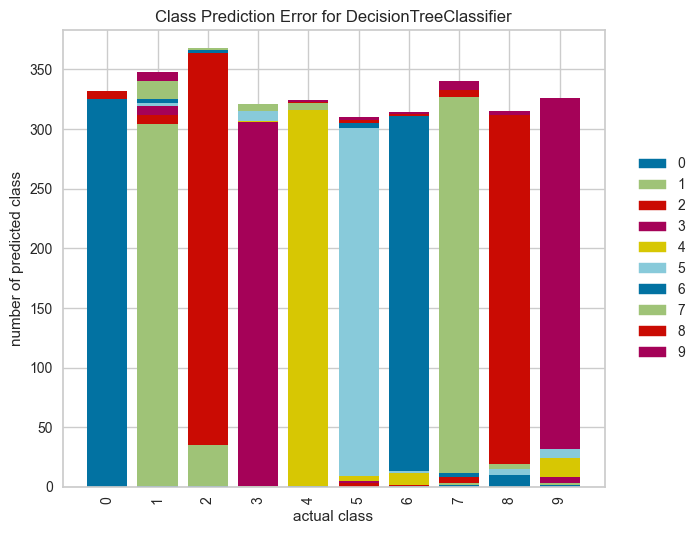

In [36]:
DT_model = DecisionTreeClassifier(random_state=1)
visualizer = ClassPredictionError(DT_model)

# Fit the training data to the visualizer
visualizer.fit(X_train, y_train)

# Evaluate the model on the test data
visualizer.score(X_test, y_test)

# Draw visualization
visualizer.poof();

## Feature Importances

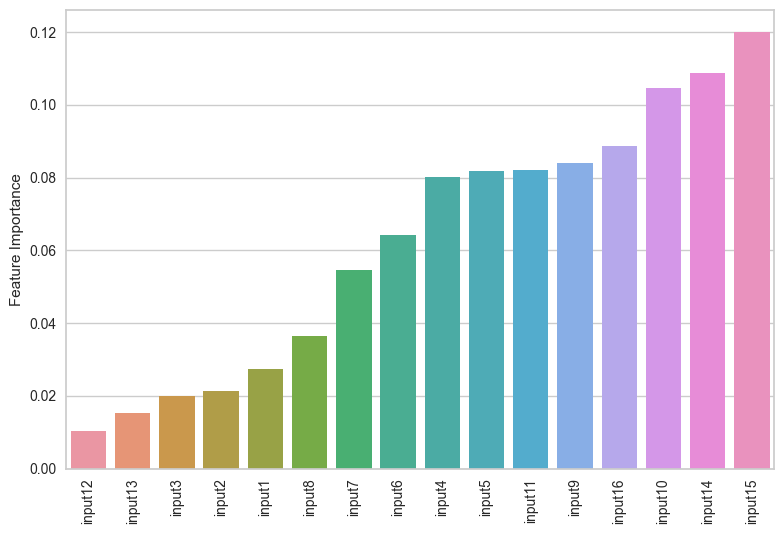

In [37]:
df_f_i = pd.DataFrame(index=X.columns, data = DT_model.feature_importances_, 
                      columns = ["Feature Importance"]).sort_values("Feature Importance")
sns.barplot(x = df_f_i.index, y = 'Feature Importance', data = df_f_i)
plt.xticks(rotation = 90)
plt.tight_layout()
plt.show()

## Grid Search

In [38]:
model = DecisionTreeClassifier(random_state=101)
param_grid = {"splitter":["best", "random"],
              "max_features":[2, 3],
              "max_depth": [None, 2, 3, 4, 5],
              "min_samples_leaf": [1, 2, 3, 4],
              "min_samples_split": [2, 3, 5, 6]}
grid_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='accuracy',
                          cv=10,
                          n_jobs = -1)
grid_model.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(random_state=101),
             n_jobs=-1,
             param_grid={'max_depth': [None, 2, 3, 4, 5],
                         'max_features': [2, 3],
                         'min_samples_leaf': [1, 2, 3, 4],
                         'min_samples_split': [2, 3, 5, 6],
                         'splitter': ['best', 'random']},
             scoring='accuracy')

In [39]:
eval_metric(grid_model, X_train, y_train, X_test, y_test)

Train_Set
[[808   0   0   0   0   0   0   0   1   0]
 [  0 795   4   1   0   0   0   1   0   2]
 [  0   9 787   0   0   0   0   2   0   0]
 [  0   3   2 728   0   1   0   2   0   0]
 [  1   2   0   0 792   0   2   0   0   1]
 [  1   3   0   2   1 726   0   0   1   4]
 [  2   1   0   0   1   1 730   1   0   0]
 [  1   2   3   3   1   0   0 781   2   1]
 [  0   0   0   0   0   0   1   1 741   0]
 [  0   3   0   0   2   1   1   1   1 730]]
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       809
           1       0.97      0.99      0.98       803
           2       0.99      0.99      0.99       798
           3       0.99      0.99      0.99       736
           4       0.99      0.99      0.99       798
           5       1.00      0.98      0.99       738
           6       0.99      0.99      0.99       736
           7       0.99      0.98      0.99       794
           8       0.99      1.00      1.00       743
           9      

In [40]:
grid_model.best_params_

{'max_depth': None,
 'max_features': 3,
 'min_samples_leaf': 1,
 'min_samples_split': 5,
 'splitter': 'best'}

# Random Forest Classifier

In [41]:
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier(random_state=101) # default degerlerle olusturduk
rf_model.fit(X_train,y_train)
eval_metric(rf_model, X_train, y_train, X_test, y_test)

Train_Set
[[809   0   0   0   0   0   0   0   0   0]
 [  0 803   0   0   0   0   0   0   0   0]
 [  0   0 798   0   0   0   0   0   0   0]
 [  0   0   0 736   0   0   0   0   0   0]
 [  0   0   0   0 798   0   0   0   0   0]
 [  0   0   0   0   0 738   0   0   0   0]
 [  0   0   0   0   0   0 736   0   0   0]
 [  0   0   0   0   0   0   0 794   0   0]
 [  0   0   0   0   0   0   0   0 743   0]
 [  0   0   0   0   0   0   0   0   0 739]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       809
           1       1.00      1.00      1.00       803
           2       1.00      1.00      1.00       798
           3       1.00      1.00      1.00       736
           4       1.00      1.00      1.00       798
           5       1.00      1.00      1.00       738
           6       1.00      1.00      1.00       736
           7       1.00      1.00      1.00       794
           8       1.00      1.00      1.00       743
           9      

In [42]:
model = RandomForestClassifier(random_state=101)

scores = cross_validate(model, X_train, y_train, scoring = ["accuracy", "precision_micro", "recall_micro", "f1_micro"], cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_accuracy           0.991812
test_precision_micro    0.991812
test_recall_micro       0.991812
test_f1_micro           0.991812
dtype: float64

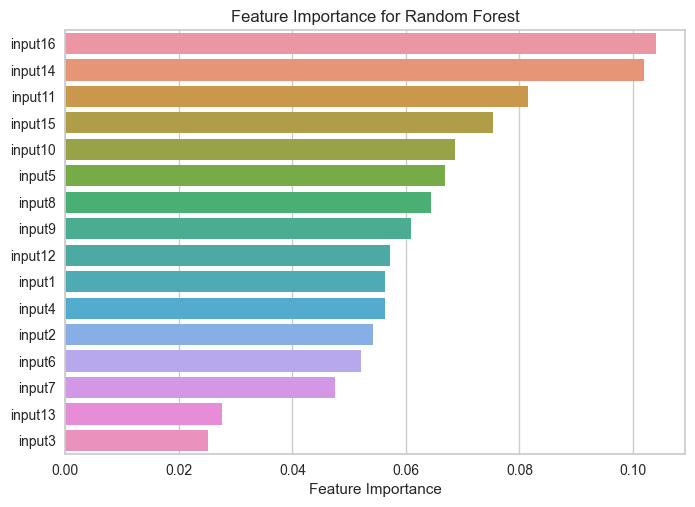

In [43]:
rf_feature_imp = pd.DataFrame(index = X.columns, data = rf_model.feature_importances_,
                              columns = ["Feature Importance"]).sort_values("Feature Importance", ascending = False)
ax = sns.barplot(x=rf_feature_imp["Feature Importance"], y=rf_feature_imp.index)
plt.title("Feature Importance for Random Forest")
plt.show()

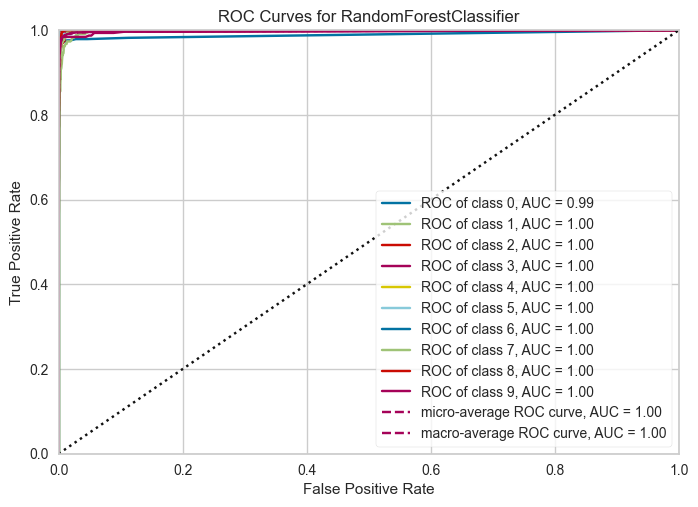

In [44]:
from yellowbrick.classifier import ROCAUC # multiclass datalarda  yellowbrick.classifier kutuphanesinden yardim aliyoruz

visualizer = ROCAUC(rf_model)

visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show();    

In [45]:
param_grid = {'n_estimators':[50, 64, 100, 128, 300],     #64 ve 128 skorlarina mutlaka bakilmasi gerektigini belirtmistik.
             'max_features':[2, 3, 4, "sqrt","log2"],
             'max_depth':[3, 5, 7, 9],
             'min_samples_split':[2, 5, 8]}
model = RandomForestClassifier(class_weight = "balanced", random_state=101)
rf_grid_model = GridSearchCV(model, param_grid, scoring = "accuracy", n_jobs = -1, verbose = -1).fit(X_train, y_train)

Fitting 5 folds for each of 300 candidates, totalling 1500 fits
[CV] END max_depth=3, max_features=2, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=3, max_features=2, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=3, max_features=2, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=3, max_features=2, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END max_depth=3, max_features=2, min_samples_split=2, n_estimators=64; total time=   0.1s
[CV] END max_depth=3, max_features=2, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END max_depth=3, max_features=2, min_samples_split=2, n_estimators=64; total time=   0.2s
[CV] END max_depth=3, max_features=2, min_samples_split=2, n_estimators=64; total time=   0.2s
[CV] END max_depth=3, max_features=2, min_samples_split=2, n_estimators=64; total time=   0.2s
[CV] END max_depth=3, max_features=2, min_samples_split=2, n_estimators=64; total

In [46]:
rf_grid_model.best_params_

{'max_depth': 9,
 'max_features': 4,
 'min_samples_split': 5,
 'n_estimators': 300}

In [47]:
eval_metric(rf_grid_model, X_train, y_train, X_test, y_test)

Train_Set
[[809   0   0   0   0   0   0   0   0   0]
 [  0 766  28   9   0   0   0   0   0   0]
 [  0   2 795   0   0   0   0   1   0   0]
 [  0   0   1 732   0   0   0   3   0   0]
 [  0   0   0   0 797   0   0   0   0   1]
 [  0   0   0   4   0 734   0   0   0   0]
 [  0   0   0   0   0   1 735   0   0   0]
 [  0   0   0   0   0   0   0 794   0   0]
 [  0   0   0   0   0   0   0   0 743   0]
 [  0   0   0   0   1   0   0   0   0 738]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       809
           1       1.00      0.95      0.98       803
           2       0.96      1.00      0.98       798
           3       0.98      0.99      0.99       736
           4       1.00      1.00      1.00       798
           5       1.00      0.99      1.00       738
           6       1.00      1.00      1.00       736
           7       0.99      1.00      1.00       794
           8       1.00      1.00      1.00       743
           9      

# Support Vector Machine (SVM) Classifier

In [48]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

svm = SVC(probability=True)
param_grid = {'C':[0.01,0.1,1,10,1000],
              'kernel':['linear','rbf','sigmoid','poly'],
              'gamma':["scale", "auto"],
              'degree':[1,2]}
grid = GridSearchCV(svm,param_grid)

In [49]:
grid.fit(X_train_scaled,y_train)

GridSearchCV(estimator=SVC(probability=True),
             param_grid={'C': [0.01, 0.1, 1, 10, 1000], 'degree': [1, 2],
                         'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'rbf', 'sigmoid', 'poly']})

In [50]:
eval_metric(grid, X_train_scaled, y_train, X_test_scaled, y_test)

Train_Set
[[809   0   0   0   0   0   0   0   0   0]
 [  0 803   0   0   0   0   0   0   0   0]
 [  0   0 797   0   0   0   0   1   0   0]
 [  0   0   2 733   0   0   0   1   0   0]
 [  0   0   0   0 798   0   0   0   0   0]
 [  0   0   0   0   0 738   0   0   0   0]
 [  0   0   0   0   0   1 735   0   0   0]
 [  0   0   0   0   0   0   0 794   0   0]
 [  0   0   0   0   0   0   0   0 743   0]
 [  0   0   0   0   0   0   0   0   0 739]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       809
           1       1.00      1.00      1.00       803
           2       1.00      1.00      1.00       798
           3       1.00      1.00      1.00       736
           4       1.00      1.00      1.00       798
           5       1.00      1.00      1.00       738
           6       1.00      1.00      1.00       736
           7       1.00      1.00      1.00       794
           8       1.00      1.00      1.00       743
           9      

## Overall performance of the model

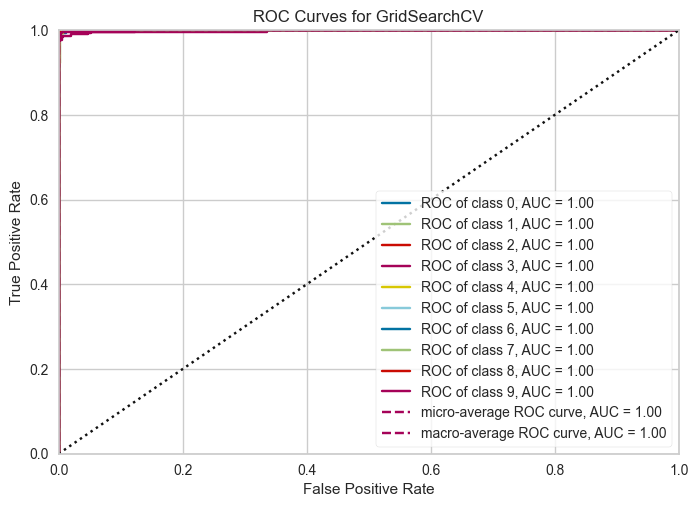

In [51]:
visualizer = ROCAUC(grid)

visualizer.fit(X_train_scaled, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test_scaled, y_test)        # Evaluate the model on the test data
visualizer.show();

# PCA

In [53]:
from sklearn.decomposition import PCA

In [63]:
pca = PCA(n_components=15,random_state=42)

pca.fit(X)

PCA(n_components=15, random_state=42)

Text(0, 0.5, 'Explained Variance')

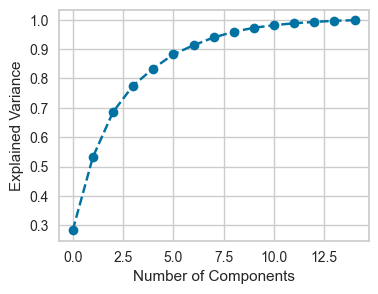

In [64]:
plt.figure(figsize=(4,3))
plt.plot(range(15),np.cumsum(pca.explained_variance_ratio_),'--o')
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance')

In [74]:
## Now we will use PCA for dimensionality reduction to visualize the clusters better
pca = PCA(n_components=5, random_state= 53)
pca_result = pca.fit_transform(X)

In [75]:
pca_df = pd.DataFrame(data = pca_result, columns = ['PCA1' , 'PCA2', 'PCA3', 'PCA4', 'PCA5'])
pca_df['class'] = y
pca_df

,PCA1,PCA2,PCA3,PCA4,PCA5,class
0,109.998129,3.498785,-21.110225,34.955546,-37.964484,8
1,-9.765395,75.791825,-20.889789,-49.960968,-34.963376,2
2,-75.009300,-8.807804,77.910133,18.837973,8.547040,1
3,-2.951036,-33.793238,8.075712,-76.781302,-36.499816,4
4,-71.366808,35.754533,53.996244,22.392238,-8.606510,1
...,...,...,...,...,...,...
10987,14.714687,-33.416870,15.650192,-93.019978,-5.165174,4
10988,7.718960,91.848199,-32.549748,-29.442834,-24.700701,2
10989,109.169357,-61.818164,-27.558439,-9.057206,-16.959418,0
10990,99.949492,-88.284117,36.880355,3.585866,-3.969415,0


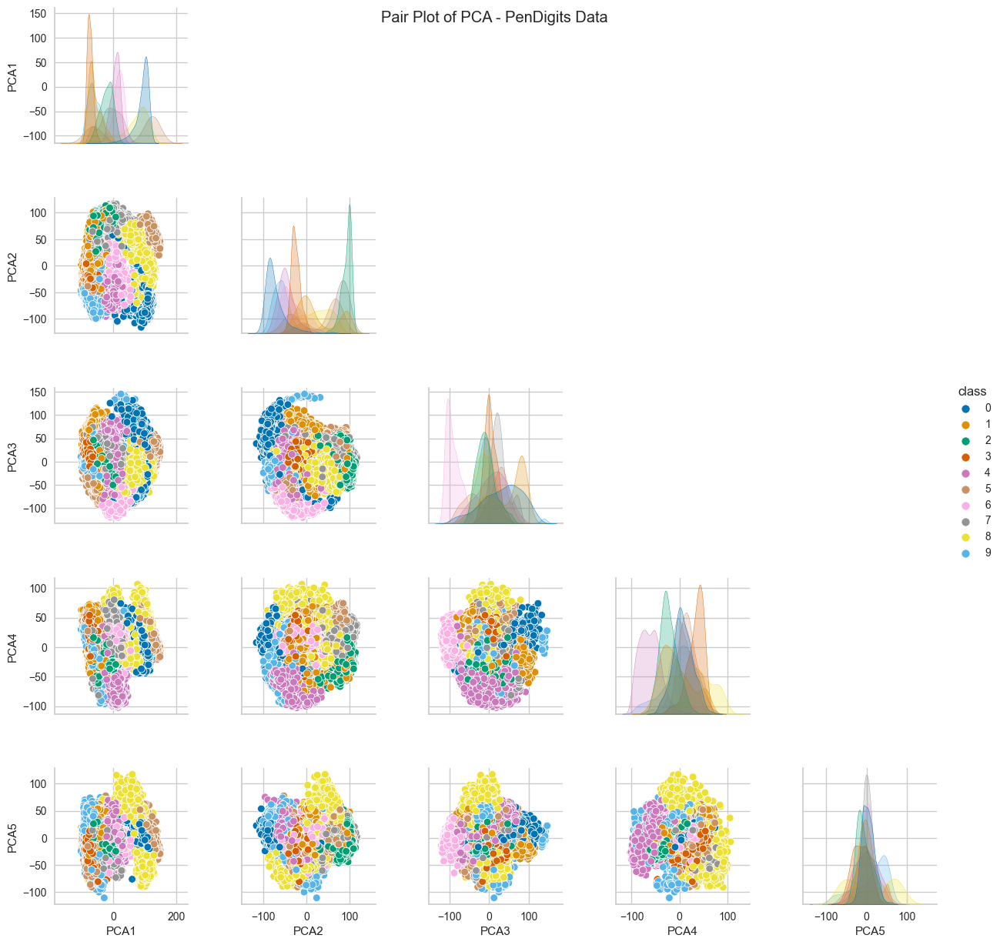

In [78]:
g = sns.pairplot(data=pca_df, diag_kind="kde", hue="class", palette='colorblind')

# Set plot title and axis labels
plt.suptitle("Pair Plot of PCA - PenDigits Data")
plt.xlabel("Variable")
plt.ylabel("Variable")

# Remove upper diagonal subplots
for i, j in zip(*plt.np.triu_indices_from(g.axes, 1)):
    g.axes[i, j].remove()

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Display the plot
plt.show()